# Organic Vs Recyclable Waste Classifier

In this notebook we will deal with a dataset containing 25,000 images of waste. This task is to build a model to classify this waste into organic waste and recyclable waste. We will experiment with this to Raspberry Pi hardware with flowing classifiers:

* 1.Pruning-Quantization-CNN
* 2.ConvneXt
* 3.Resnet
* 4.VGG
* 5.EfficientNet
* 6.MobileNet

# Image Visualization & Processing¶

22564
2513


100%|██████████| 1401/1401 [00:04<00:00, 337.79it/s]


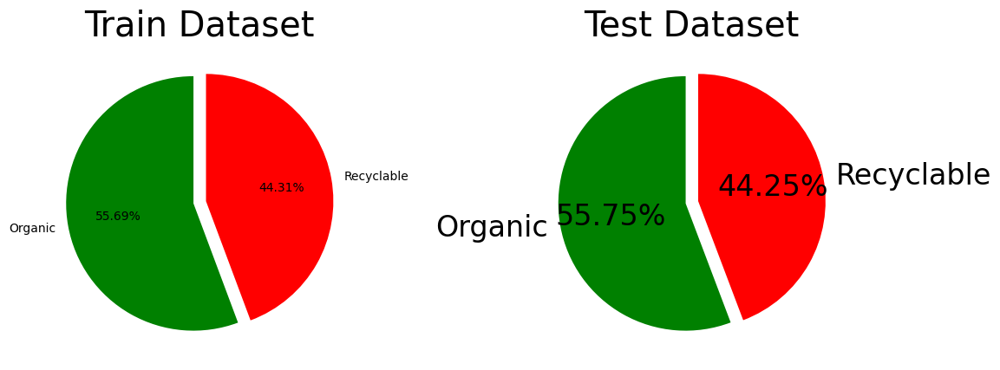

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import warnings
import os
warnings.filterwarnings('ignore')

train_path0 = "/kaggle/input/waste-classification-data/DATASET/TRAIN/O"
train_path1 = "/kaggle/input/waste-classification-data/DATASET/TRAIN/R"

test_path0 = "/kaggle/input/waste-classification-data/DATASET/TEST/O"
test_path1 = "/kaggle/input/waste-classification-data/DATASET/TEST/R"

import fnmatch

print(len(fnmatch.filter(os.listdir(train_path0), '*.jpg')) +  len(fnmatch.filter(os.listdir(train_path1), '*.jpg')))
print(len(fnmatch.filter(os.listdir(test_path0), '*.jpg')) +  len(fnmatch.filter(os.listdir(test_path1), '*.jpg')))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense , BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import plot_model
from glob import glob

def load_data(path):
    x_data = []
    y_data = []
    for category in glob(path+'/*'):
        for file in tqdm(glob(category+'/*')):
            img_array = cv2.imread(file)
            img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)
            x_data.append(img_array)
            y_data.append(category.split('/')[-1])
    data = pd.DataFrame({'image' : x_data, 'label' : y_data})
    return data

train_path = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_path = "/kaggle/input/waste-classification-data/DATASET/TEST/"

# Load train data
train_data = load_data(train_path)
# Load test data
test_data = load_data(test_path)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
colors = ['green', 'red']
plt.pie(train_data['label'].value_counts(), 
        labels=['Organic', 'Recyclable'], 
        autopct='%0.2f%%', 
        colors=colors, 
        startangle=90, 
        explode=[0.05, 0.05])
plt.rcParams.update({'font.size': 24})
plt.title('Train Dataset')

plt.subplot(1, 2, 2)
plt.pie(test_data['label'].value_counts(), 
        labels=['Organic', 'Recyclable'], 
        autopct='%0.2f%%', 
        colors=colors, 
        startangle=90, 
        explode=[0.05, 0.05])
plt.title('Test Dataset')
plt.rcParams.update({'font.size': 24})
plt.tight_layout()
plt.show()

# 1. PQ-CNN Model

## 1.1. Evaluation of PQ-CNN Model

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time

# Test path folders
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'
model_path = '/kaggle/input/model_quantized/tensorflow2/default/1/model_cnn_quantized.tflite'

# Load model TFLite
def load_tflite_model(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    return interpreter

# Function to preprocess images
def preprocess_image(image_path, input_size):
    # Read image
    img = cv2.imread(image_path)
    # Convert to RGB 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img_resized = cv2.resize(img, input_size)
    # Normalize the image 
    img_normalized = img_resized.astype(np.float32) / 255.0
    # Add batch dimension
    input_data = np.expand_dims(img_normalized, axis=0)
    return input_data

# predict function
def predict_image(interpreter, input_data):
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Assign data to model
    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()

    # Get the prediction results
    output_data = interpreter.get_tensor(output_details[0]['index'])
    return output_data

interpreter = load_tflite_model(model_path)

def predict_fun(image_path):
    # Get the input dimensions of the model
    input_details = interpreter.get_input_details()
    input_shape = input_details[0]['shape']
    input_size = (input_shape[1], input_shape[2])  # (width, height)

    # Image preprocessing
    input_data = preprocess_image(image_path, input_size)

    # Predict
    predictions = predict_image(interpreter, input_data)

    predicted_class = np.argmax(predictions)
    if predicted_class == 0:
        return 0
    else:
        return 1

# load image 
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)

        if img_path is not None:
            # Resize to 224x224
            prediction = predict_fun(img_path)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
          
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report classification
report = classification_report(y_test, y_pred, target_names=['Organic', 'Recycle'])
print('Classification Report:')
print(report)

2025-07-15 03:10:36.006454: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752549036.482692      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752549036.597925      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


Accuracy: 0.92
Confusion Matrix:
[[1340   61]
 [ 141  971]]
Classification Report:
              precision    recall  f1-score   support

     Organic       0.90      0.96      0.93      1401
     Recycle       0.94      0.87      0.91      1112

    accuracy                           0.92      2513
   macro avg       0.92      0.91      0.92      2513
weighted avg       0.92      0.92      0.92      2513



## 1.2. Example of PQ-CNN Model Prediction

The image is Organic
Time process: 0.07738709449768066 s
The image is Organic
Time process: 0.06985759735107422 s
The image is Organic
Time process: 0.05100059509277344 s
The image is Organic
Time process: 0.05072498321533203 s
The image is Organic
Time process: 0.0611872673034668 s
The image is Organic
Time process: 0.051320552825927734 s


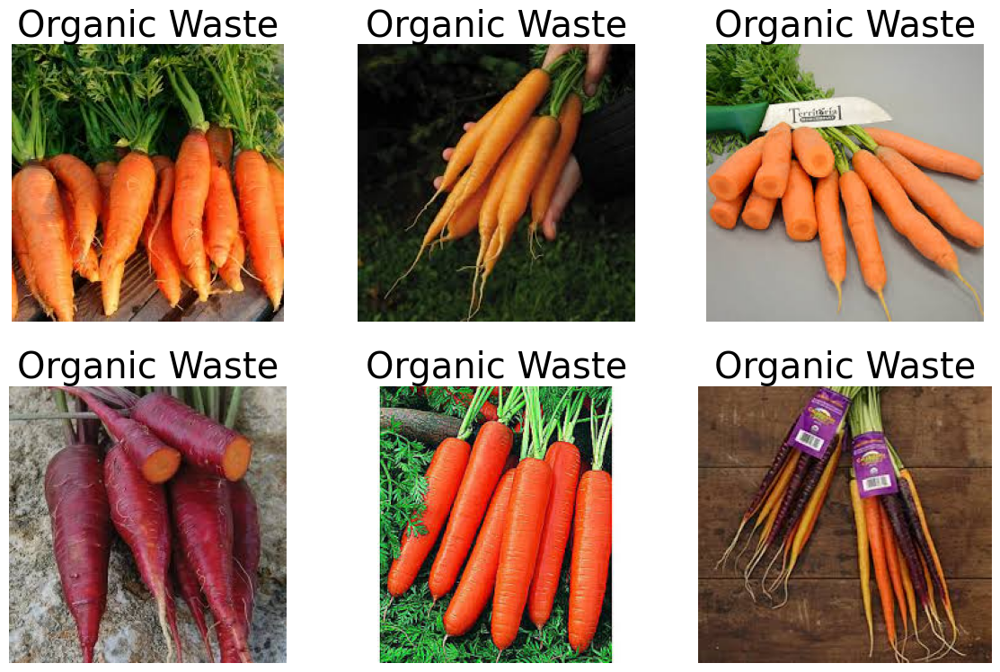

The image is Recycle
Time process: 0.057314395904541016 s
The image is Recycle
Time process: 0.049835920333862305 s
The image is Recycle
Time process: 0.04910540580749512 s
The image is Recycle
Time process: 0.05379509925842285 s
The image is Recycle
Time process: 0.05221819877624512 s
The image is Recycle
Time process: 0.051340579986572266 s


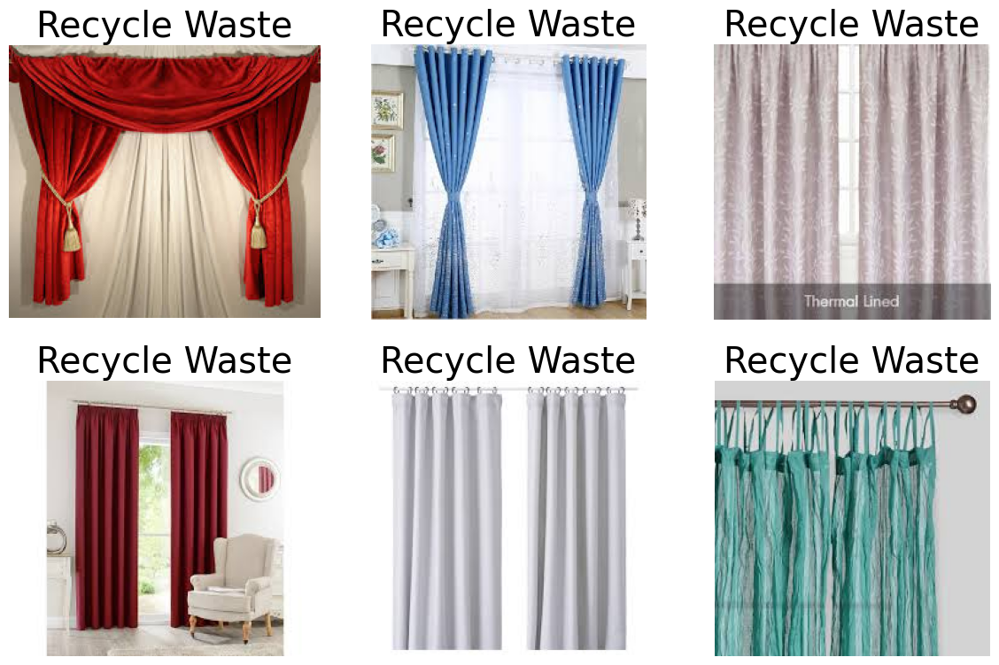

Average processing time per image: 0.054038619995117186 s


In [7]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time

model_path = '/kaggle/input/model_quantized/tensorflow2/default/1/model_cnn_quantized.tflite'
# Load model TFLite
def load_tflite_model(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    return interpreter

# Function to preprocess images
def preprocess_image(image_path, input_size):
    # Read image
    img = cv2.imread(image_path)
    # Convert to RGB 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img_resized = cv2.resize(img, input_size)
    # Normalize the image 
    img_normalized = img_resized.astype(np.float32) / 255.0
    # Add batch dimension
    input_data = np.expand_dims(img_normalized, axis=0)
    return input_data

# predict function
def predict_image(interpreter, input_data):
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Assign data to model
    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()

    # Get the prediction results
    output_data = interpreter.get_tensor(output_details[0]['index'])
    return output_data
    
def predict_fun(image_path):
    # Load model
    interpreter = load_tflite_model(model_path)

    # Get the input dimensions of the model
    input_details = interpreter.get_input_details()
    input_shape = input_details[0]['shape']
    input_size = (input_shape[1], input_shape[2])  # (width, height)

    # Image preprocessing
    input_data = preprocess_image(image_path, input_size)

    # Predict
    predictions = predict_image(interpreter, input_data)

    predicted_class = np.argmax(predictions)
    if predicted_class == 0:
        print("The image is Organic")
        return 'Organic Waste';
    else:
        print("The image is Recycle")
        return 'Recycle Waste';
   
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  
all_time = 0
for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  

for i in range(6):
    # create figure
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")

## 1.3. Comparision sizes of CNN, Pruned, Quantizned Model.

In [8]:
import os
def getsize(path):
    return os.path.getsize(path)

path_cnn = '/kaggle/input/model_cnn/tensorflow2/default/1/my_cnn_model.h5'
path_quantized_cnn = '/kaggle/input/model_quantized/tensorflow2/default/1/model_cnn_quantized.tflite'
path_pruned_cnn= '/kaggle/input/model_pruned/tensorflow2/default/1/pruned_cnn_model.h5'

print(f"Size of CNN model: {getsize(path_cnn)/1000000}MB")
print(f"Size of Pruned CNN model: {getsize(path_pruned_cnn)/1000000}MB")
print(f"Size of Quantized CNN model: {getsize(path_quantized_cnn)/1000000}MB")
print(f"Quantized CNN model reduce: {getsize(path_cnn)/getsize(path_quantized_cnn)} times")

Size of CNN model: 267.199296MB
Size of Pruned CNN model: 89.099368MB
Size of Quantized CNN model: 22.276512MB
Quantized CNN model reduce: 11.994664873926403 times


# 2. ConvNeXt Model

## 2.1 Evaluation of ConvNeXt Model

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from torchvision import datasets, transforms, models
import torch
import torch.nn as nn
import torch.optim as optim
from pathlib import Path
from torch.utils.data import DataLoader
import torch.nn.functional as F

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_path = '/kaggle/input/model_convnext/tensorflow2/default/1/convnext_rac_model.pth'

# path to dataset
train_dir = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_dir = "/kaggle/input/waste-classification-data/DATASET/TEST/"

# Transform dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Create dataset
train_dataset = datasets.ImageFolder(train_dir, transform=transform)
test_dataset = datasets.ImageFolder(test_dir, transform=transform)

# Testing data
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# Load saved model
model = models.convnext_tiny(pretrained=False)
model.classifier[2] = nn.Linear(model.classifier[2].in_features, 2)
model.load_state_dict(torch.load(model_path))
model = model.to(device)
model.eval()

# Prediction function
def predict_image(image_path, model):
    image = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])(Image.open(image_path).convert('RGB'))

    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
        probs = F.softmax(output, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
        class_name = train_dataset.classes[pred_class]
        confidence = probs[0][pred_class].item()
    #return class_name, confidence

# Grade 0 is organic, grade 1 is recycled
    if class_name == 'O':
        #print('The image is Organic Waste')
        return 0
    elif class_name == 'R':
        #print('The image is Inorganic Waste')
        return 1
    
from PIL import Image

# Image loading and preprocessing function
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        #img = cv2.imread(img_path)
        if img_path is not None:
            # Resize ảnh về kích thước phù hợp, ví dụ 224x224
            prediction = predict_image(img_path, model)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
       
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# Classification report
report = classification_report(y_test, y_pred, target_names=['Organic', 'Recycle'])
print('Classification Report:')
print(report)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Accuracy: 0.98
Confusion Matrix:
[[1385   16]
 [  43 1069]]
Classification Report:
              precision    recall  f1-score   support

     Organic       0.97      0.99      0.98      1401
     Recycle       0.99      0.96      0.97      1112

    accuracy                           0.98      2513
   macro avg       0.98      0.97      0.98      2513
weighted avg       0.98      0.98      0.98      2513



## 2.2 Example of ConvNeXt Model Prediction

The image is Organic
Time process: 0.28180861473083496 s
The image is Organic
Time process: 0.06990480422973633 s
The image is Organic
Time process: 0.07060670852661133 s
The image is Organic
Time process: 0.07496404647827148 s
The image is Organic
Time process: 0.07831430435180664 s
The image is Recycle
Time process: 0.06951498985290527 s


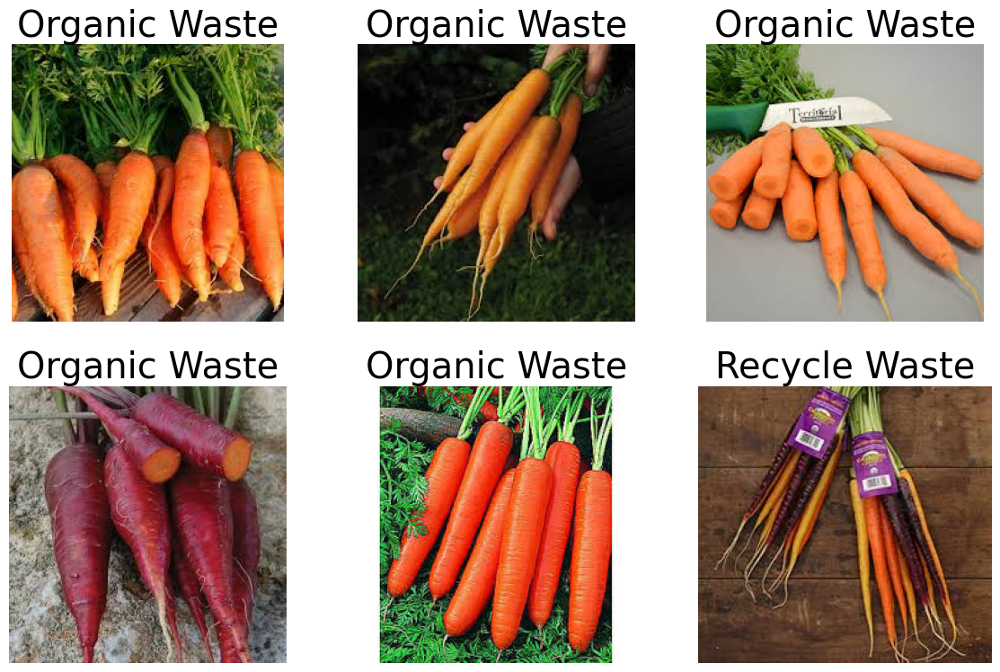

The image is Recycle
Time process: 0.07255053520202637 s
The image is Recycle
Time process: 0.0685892105102539 s
The image is Recycle
Time process: 0.06919050216674805 s
The image is Recycle
Time process: 0.07278251647949219 s
The image is Recycle
Time process: 0.07338285446166992 s
The image is Recycle
Time process: 0.0687413215637207 s


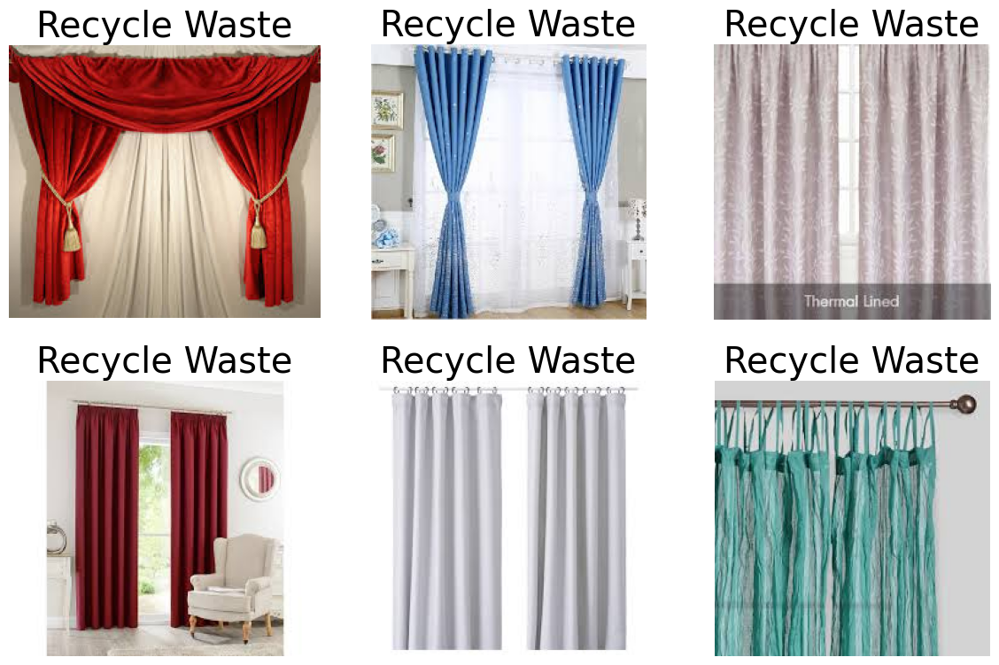

Average processing time per image: 0.07159912586212158 s


In [10]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import os
from pathlib import Path
from torch.utils.data import DataLoader
import torch.nn.functional as F

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

# Set device to CPU
device = torch.device('cpu')

model_path  = '/kaggle/input/model_convnext/tensorflow2/default/1/convnext_rac_model.pth'

# Dataset path
train_dir = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_dir = "/kaggle/input/waste-classification-data/DATASET/TEST/"

# Transform dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Create dataset
train_dataset = datasets.ImageFolder(train_dir, transform=transform)
test_dataset = datasets.ImageFolder(test_dir, transform=transform)

# load model
model_loaded = models.convnext_tiny(pretrained=False)
model_loaded.classifier[2] = nn.Linear(model_loaded.classifier[2].in_features, 2)
model_loaded.load_state_dict(torch.load(model_path, map_location='cpu'))  
model_loaded = model_loaded.to(device)
model_loaded.eval()

# predict
def predict_fun(image_path, model):
    image = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])(Image.open(image_path).convert('RGB'))

    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
        probs = F.softmax(output, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
        class_name = train_dataset.classes[pred_class]
        confidence = probs[0][pred_class].item()
    if class_name == 'R':
        print("The image is Recycle")
        return 'Recycle Waste'
    if class_name == 'O':
        print("The image is Organic")
        return 'Organic Waste'
   
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

all_time = 0  # Initialize timer variable

for i in range(6):
    # Sample image path
    img_path = f'/kaggle/input/waste-classification-data/DATASET/TEST/O/O_{12568 + i}.jpg'
    start = time.time()
    prediction = predict_fun(img_path, model_loaded)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time += time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for i in range(6):
    img_path = f'/kaggle/input/waste-classification-data/DATASET/TEST/R/R_{10000 + i}.jpg'
    start = time.time()
    prediction = predict_fun(img_path, model_loaded)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time += time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")

# 3. VGG16 Model

## 3.1 Evaluation of VGG16 Model

In [3]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load model
model = load_model('/kaggle/input/model_vgg16/tensorflow2/default/1/vgg16_O_R_classifier.keras')

# Testing dataset
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# Image function
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if img_path is not None:
            # Resize 224x224
            prediction = predict_fun(img_path)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    
def predict_fun(img_path):
    # load image
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  
    x = np.expand_dims(x, axis=0)  # add batch size
    
    # Predict
    prediction = model.predict(x, verbose=None)
    
    if prediction[0][0] >= 0.5:
        return 1
    else:
        return 0
            
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Organic', 'Recycle'])
print('Classification Report:')
print(report)

I0000 00:00:1752549199.207832      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13762 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1752549199.208468      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1752549204.548307     106 service.cc:148] XLA service 0x7c5b48006490 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752549204.549713     106 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1752549204.549735     106 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1752549204.745654     106 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1752549207.094922     106 device_compiler.h:188] Compiled clust

Accuracy: 0.89
Confusion Matrix:
[[1343   58]
 [ 217  895]]
Classification Report:
              precision    recall  f1-score   support

     Organic       0.86      0.96      0.91      1401
     Recycle       0.94      0.80      0.87      1112

    accuracy                           0.89      2513
   macro avg       0.90      0.88      0.89      2513
weighted avg       0.90      0.89      0.89      2513



## 3.2. Example of VGG16 Model Prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step
The predicted image is Organic
Time process: 0.8125355243682861 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
The predicted image is Organic
Time process: 0.08847403526306152 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
The predicted image is Organic
Time process: 0.08944487571716309 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
The predicted image is Organic
Time process: 0.08957457542419434 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
The predicted image is Organic
Time process: 0.08867907524108887 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The predicted image is Organic
Time process: 0.08872556686401367 s


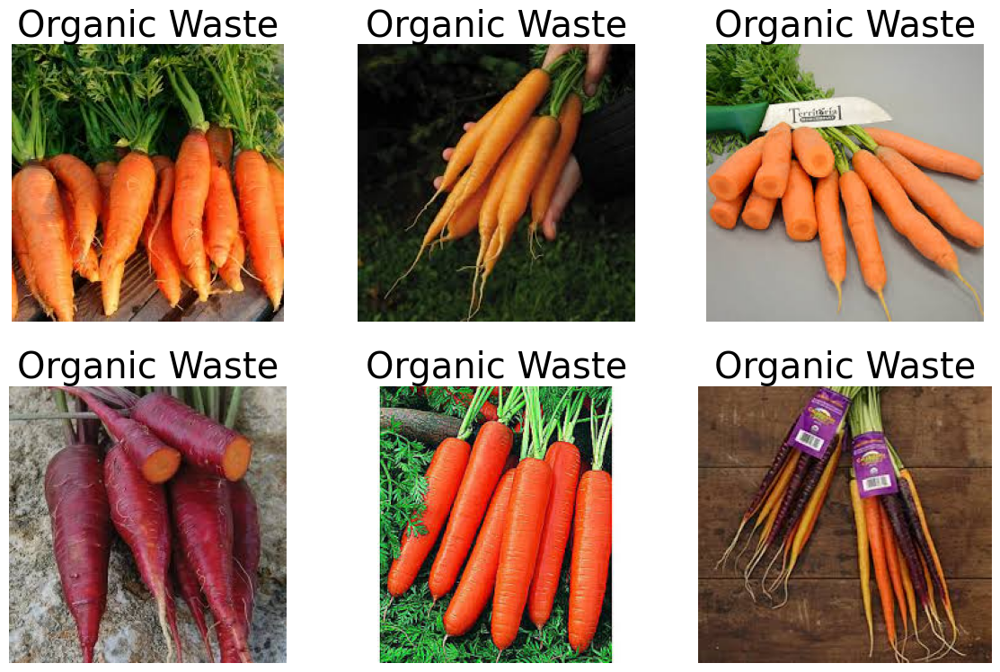

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted image is Recycle
Time process: 0.09578108787536621 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The predicted image is Recycle
Time process: 0.09145808219909668 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
The predicted image is Organic
Time process: 0.09045004844665527 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted image is Recycle
Time process: 0.0900733470916748 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted image is Recycle
Time process: 0.09376263618469238 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted image is Organic
Time process: 0.09368681907653809 s


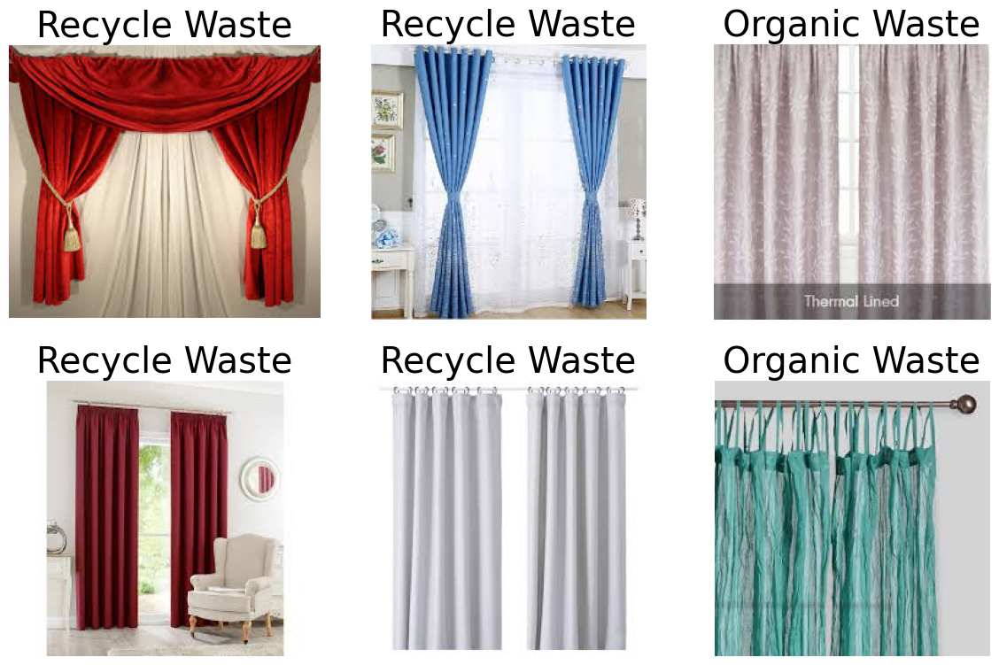

Average processing time per image: 0.09043290615081787 s


In [12]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/model_vgg16/tensorflow2/default/1/vgg16_O_R_classifier.keras')

def predict_fun(img_path):
    # Upload and process images
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  # Apply the same rescale step
    x = np.expand_dims(x, axis=0)  # Add batch size
    
    # Predict
    prediction = model.predict(x)
    
    # Class determination based on threshold 0.5
    if prediction[0][0] >= 0.5:
        print("The predicted image is Recycle")
        return 'Recycle Waste'
    else:
        print("The predicted image is Organic")
        return 'Organic Waste'

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")

# 4. MobileNetV2 Model

# 4.1. Evaluation of MobileNetV2 Model

In [16]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load model
model = load_model('/kaggle/input/model_mobilenetv2/tensorflow2/default/1/my_model_mobilenetv2.h5')

# test folders
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# load image
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            # Resize  224x224
            prediction = predict_fun(img)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    
def predict_fun(img):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image (224x224)
    resized_img = cv2.resize(image_rgb, (224, 224))
    # Convert float32
    resized_img = resized_img.astype('float32') / 255.0  # Mô hình được huấn luyện với dữ liệu chuẩn hóa 0-1
    # add batch dimension
    input_img = np.expand_dims(resized_img, axis=0)
    # predict
    prediction = model.predict(input_img, verbose=None)
    result = np.argmax(prediction)

    
    if result == 0:
        #print('The image is Organic Waste')
        return 0
    elif result == 1:
        #print('The image is Inorganic Waste')
        return 1
        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Organic', 'Recycle'])
print('Classification Report:')
print(report)

KeyboardInterrupt: 

## 4.2. Example of MobileNetV2 Model Prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
The predicted image is Organic 
Time process: 3.0211005210876465 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
The predicted image is Organic 
Time process: 0.07960653305053711 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The predicted image is Organic 
Time process: 0.0827176570892334 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
The predicted image is Organic 
Time process: 0.0801548957824707 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The predicted image is Organic 
Time process: 0.07974982261657715 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The predicted image is Organic 
Time process: 0.07600164413452148 s


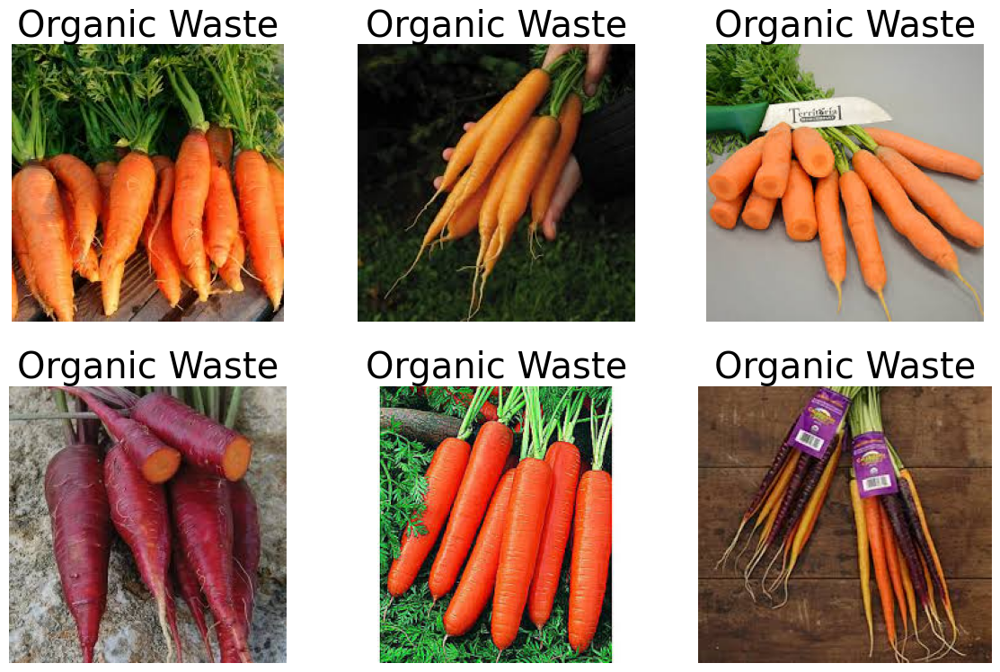

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
The predicted image is Recycle
Time process: 0.0815274715423584 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
The predicted image is Recycle
Time process: 0.07994198799133301 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
The predicted image is Organic 
Time process: 0.0758812427520752 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The predicted image is Recycle
Time process: 0.07992410659790039 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
The predicted image is Recycle
Time process: 0.07433724403381348 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
The predicted image is Organic 
Time process: 0.07667040824890137 s


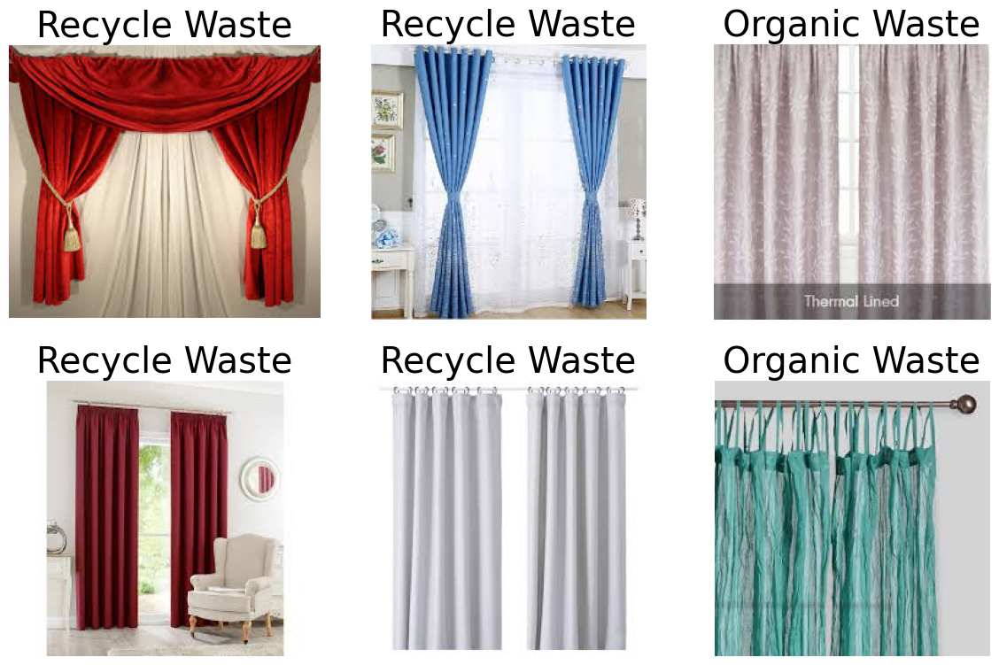

Average processing time per image: 0.07849855422973633 s


In [14]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/model_mobilenetv2/tensorflow2/default/1/my_model_mobilenetv2.h5')

def predict_fun(img_path):
    # Upload and process images
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  # Apply same rescale step
    x = np.expand_dims(x, axis=0)  # Add batch size
    
    # Predict
    prediction = model.predict(x)
    
    # Class determination based on threshold 0.5
    if prediction[0][0] <= 0.5:
        print("The predicted image is Organic ")
        return 'Organic Waste'
    else:
        print("The predicted image is Recycle")
        return 'Recycle Waste'

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i !=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off') 

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i !=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")

# 4. ResNet Model

## 4.1. Evaluation of ResNet Model

In [3]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Load model
model = load_model('/kaggle/input/model_resnet50/tensorflow2/default/1/resnet50_waste_classifier.h5')

# test folders
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# load image
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if img_path is not None:
            # Resize  224x224
            prediction = predict_fun(img_path)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred

class_indices = {'organic': 0, 'recyle': 1} 

# Prediction function from an image
def predict_fun(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # tạo batch 1
    pred = model.predict(img_array, verbose=None)[0][0]
    class_labels = {v: k for k, v in class_indices.items()}
    
    if pred <= 0.5:
        label = 1 
    else:
        label = 0 
    #confidence = pred if pred >= 0.5 else 1 - pred
    #print(f"Prediction: {label} ({confidence*100:.2f}%)")
    return label

y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Organic', 'Recyle'])
print('Classification Report:')
print(report)

I0000 00:00:1752544790.963328      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1752544790.964231      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1752544798.451252      99 service.cc:148] XLA service 0x7c3964048700 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752544798.452476      99 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1752544798.452501      99 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1752544799.158010      99 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1752544801.956478      99 device_compiler.h:188] Compiled clust

Accuracy: 0.91
Confusion Matrix:
[[1368   33]
 [ 190  922]]
Classification Report:
              precision    recall  f1-score   support

     Organic       0.88      0.98      0.92      1401
      Recyle       0.97      0.83      0.89      1112

    accuracy                           0.91      2513
   macro avg       0.92      0.90      0.91      2513
weighted avg       0.92      0.91      0.91      2513



## 4.2 Example of ResNet Model Prediction

The predicted image is Organic
Time process: 2.9803903102874756 s
The predicted image is Organic
Time process: 0.07736325263977051 s
The predicted image is Organic
Time process: 0.07318735122680664 s
The predicted image is Organic
Time process: 0.07337021827697754 s
The predicted image is Organic
Time process: 0.07221341133117676 s
The predicted image is Organic
Time process: 0.07376980781555176 s


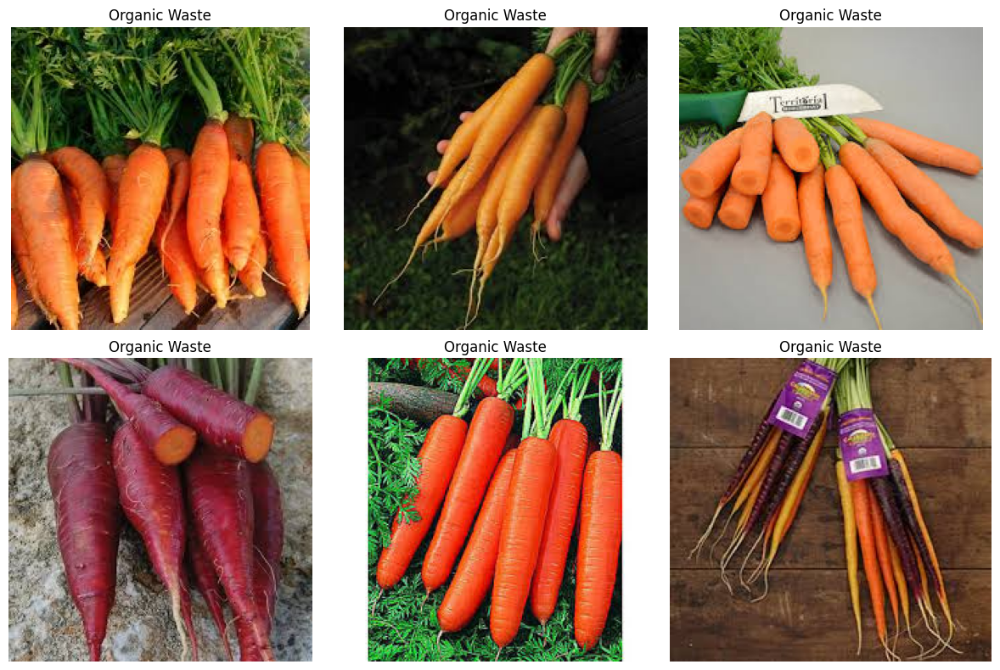

The predicted image is Recycle 
Time process: 0.07715153694152832 s
The predicted image is Recycle 
Time process: 0.07103109359741211 s
The predicted image is Organic
Time process: 0.07144331932067871 s
The predicted image is Recycle 
Time process: 0.07219672203063965 s
The predicted image is Recycle 
Time process: 0.07227182388305664 s
The predicted image is Organic
Time process: 0.07256650924682617 s


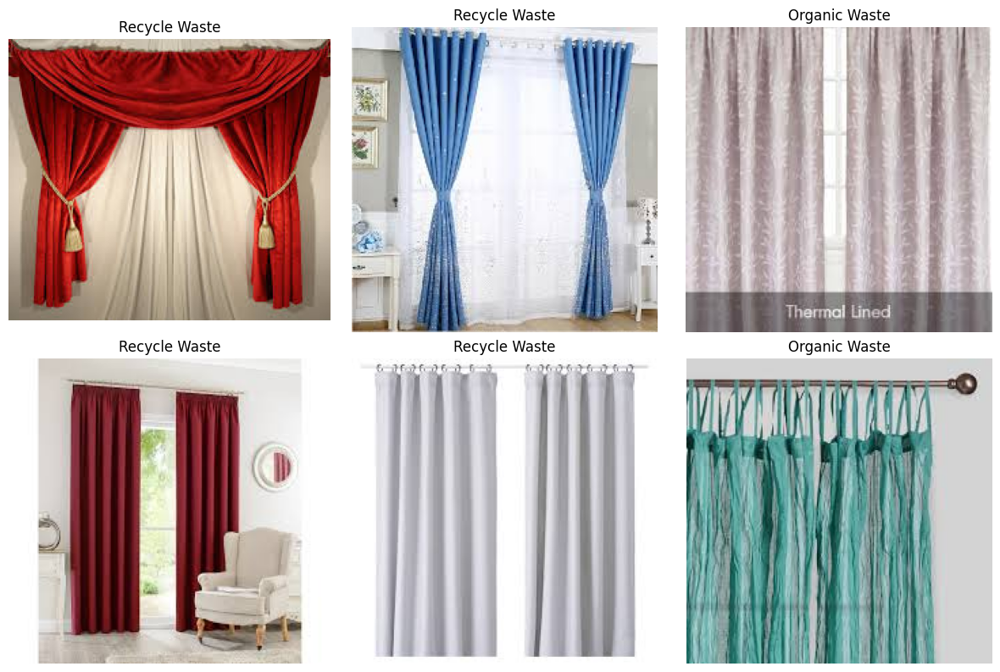

Average processing time per image: 0.07294135093688965 s


In [2]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/model_mobilenetv2/tensorflow2/default/1/my_model_mobilenetv2.h5')

class_indices = {'organic': 0, 'recyle': 1} 

# Prediction function from an image
def predict_fun(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # tạo batch 1
    pred = model.predict(img_array, verbose=None)[0][0]
    class_labels = {v: k for k, v in class_indices.items()}

    # Class determination based on threshold 0.5
    if pred <= 0.5:
        print("The predicted image is Recycle ")
        return 'Recycle Waste'
    else:
        print("The predicted image is Organic")
        return 'Organic Waste'
        
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i !=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off') 

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i !=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")

# 5. EfficientNet Model

## 5.1. Evaluation of EfficientNet Model

In [5]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

model = load_model('/kaggle/input/model_effectlite/tensorflow2/default/1/my_model_effectlite.h5')

folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            # Resize  224x224
            prediction = predict_fun(img)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    
def predict_fun(img):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize (224x224)
    resized_img = cv2.resize(image_rgb, (224, 224))
    # Cconvert float32
    resized_img = resized_img.astype('float32') / 255.0  # Mô hình được huấn luyện với dữ liệu chuẩn hóa 0-1
    # add batch dimension
    input_img = np.expand_dims(resized_img, axis=0)
    # predict
    prediction = model.predict(input_img, verbose=None)
    result = np.argmax(prediction)
    
    if result == 0:
        #print('The image is Organic Waste')
        return 0
    elif result == 1:
        #print('The image is Inorganic Waste')
        return 1
        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Organic', 'Recycle'])
print('Classification Report:')
print(report)

Accuracy: 0.91
Confusion Matrix:
[[1362   39]
 [ 187  925]]
Classification Report:
              precision    recall  f1-score   support

     Organic       0.88      0.97      0.92      1401
     Recycle       0.96      0.83      0.89      1112

    accuracy                           0.91      2513
   macro avg       0.92      0.90      0.91      2513
weighted avg       0.91      0.91      0.91      2513



## 5.2 Example of EfficientNet Model Prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
The predicted image is Organic
Time process: 9.280123710632324 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
The predicted image is Organic
Time process: 0.09836220741271973 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
The predicted image is Organic
Time process: 0.09350180625915527 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted image is Organic
Time process: 0.09298586845397949 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted image is Organic
Time process: 0.0896451473236084 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted image is Recycle
Time process: 0.0899055004119873 s


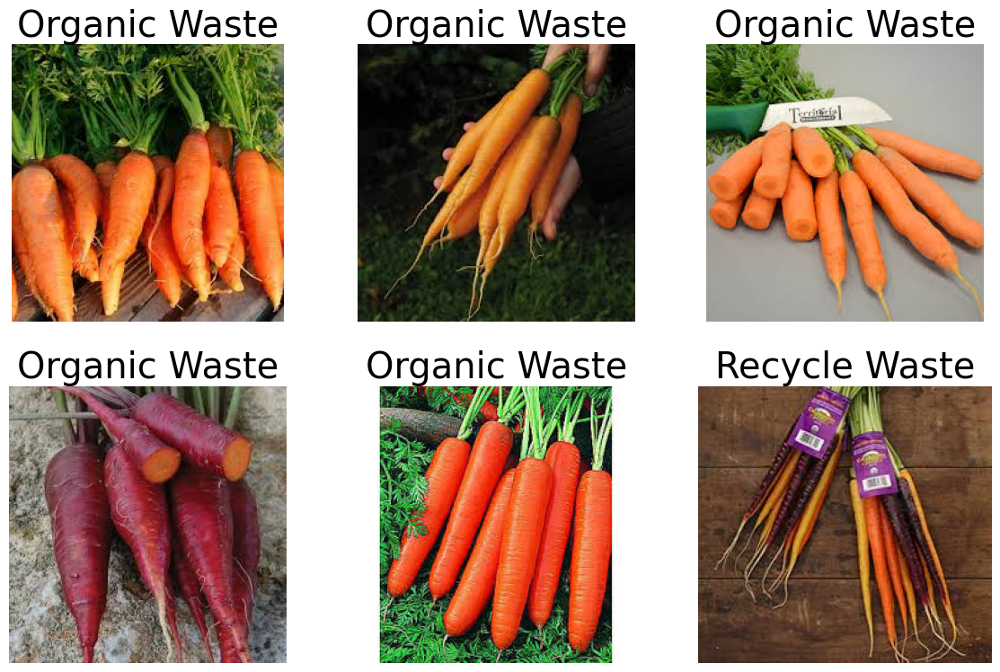

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
The predicted image is Organic
Time process: 0.09637451171875 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The predicted image is Recycle
Time process: 0.08777737617492676 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The predicted image is Recycle
Time process: 0.08956623077392578 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The predicted image is Recycle
Time process: 0.08962440490722656 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The predicted image is Recycle
Time process: 0.08845996856689453 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The predicted image is Recycle
Time process: 0.09039139747619629 s


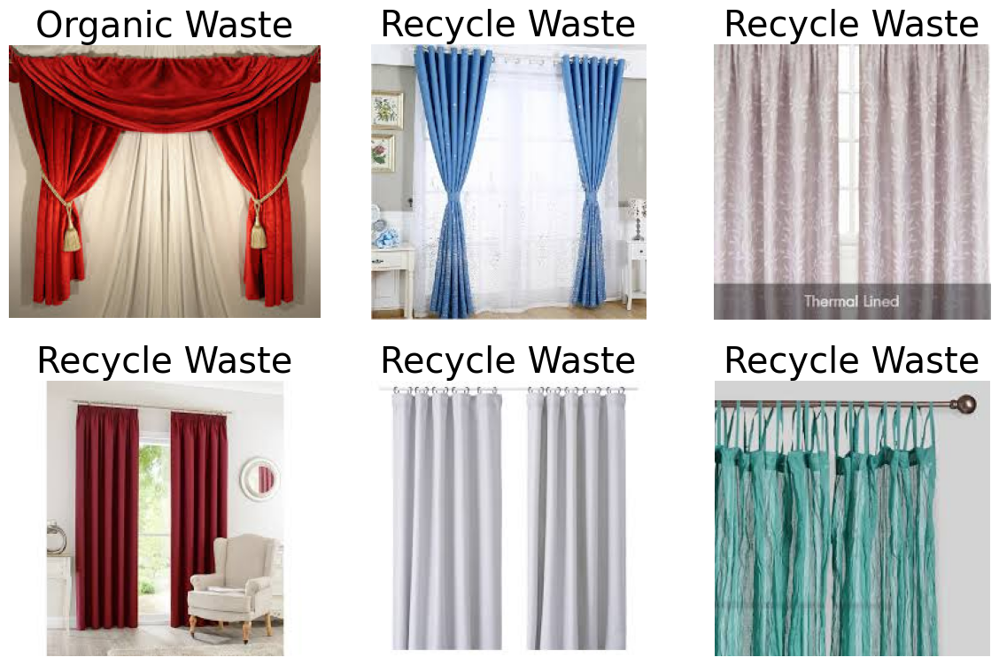

Average processing time per image: 0.09102199077606202 s


In [17]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/model_effectlite/tensorflow2/default/1/my_model_effectlite.h5')

def predict_fun(img_path):
    # Upload and process images
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  # Apply the same rescale step
    x = np.expand_dims(x, axis=0)  # Add batch size
    
    # Predict
    prediction = model.predict(x)
    
    # Class determination based on threshold 0.5
    if prediction[0][0] >= 0.5:
        print("The predicted image is Organic")
        return 'Organic Waste'
    else:
        print("The predicted image is Recycle")
        return 'Recycle Waste'

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")

# 6. Evaluation of Models.

## 6.1 Confusion Matrix

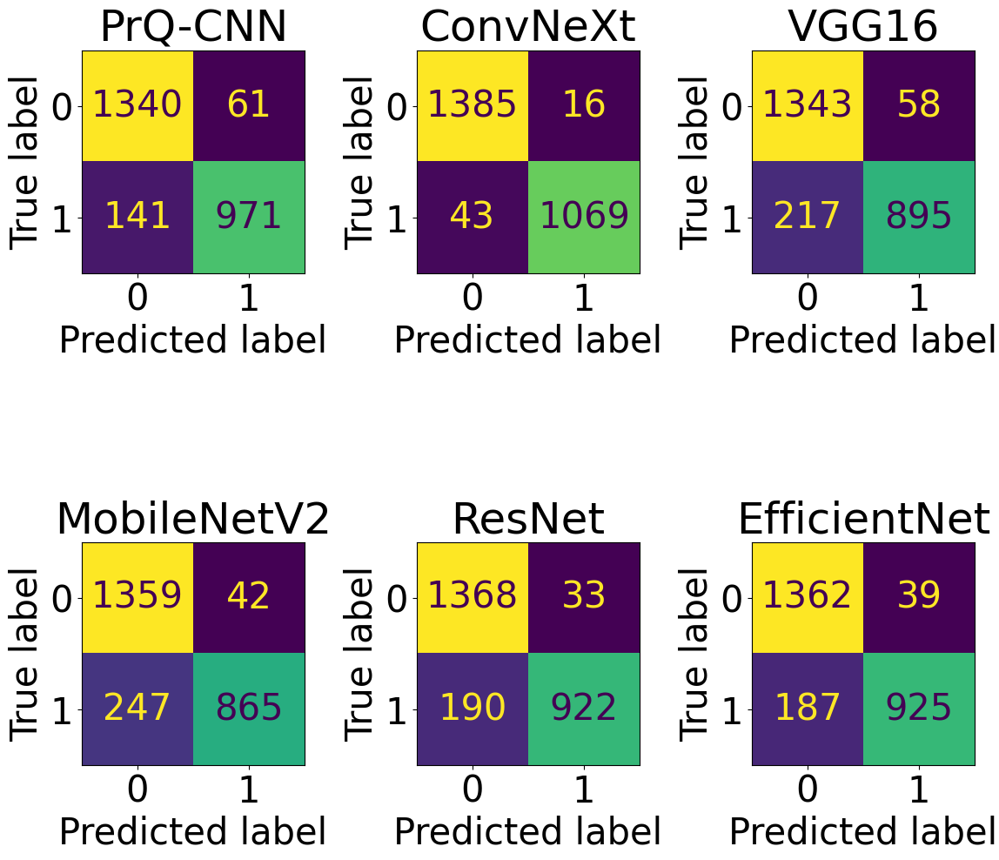

In [3]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
import numpy as np

# Define the confusion matrices
cmats = [
    np.array([[1340, 61], 
              [141, 971]]),   # CNN
    np.array([[1385, 16],
              [43, 1069]]), #ConvNext
    np.array([[1343, 58],
              [217, 895]]), #VGG16
    np.array([[1359, 42],
              [247, 865]]), #MobileNetV2
    np.array([[1368, 33],
              [190, 922]]), #RESNet
    np.array([[1362, 39],
              [187, 925]]) #EffectLiteNet
]

# Create a 3x2 grid for subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 12))
axes = axes.flatten()  # Flatten to easily iterate

# Plot each confusion matrix
for i, cm in enumerate(cmats):
    disp = ConfusionMatrixDisplay(cm)
    
    disp.plot(ax=axes[i], colorbar=False)
    
    if i== 0:
        axes[i].set_title(f'PrQ-CNN')
    if i== 1:
        axes[i].set_title(f'ConvNeXt')
    if i== 2:
        axes[i].set_title(f'VGG16')
    if i== 3:
        axes[i].set_title(f'MobileNetV2')
    if i== 4:
        axes[i].set_title(f'ResNet')
    if i== 5:
        axes[i].set_title(f'EfficientNet')

# Remove the unused subplot (since only 5 matrices for 6 subplots)
#fig.delaxes(axes[-1])  # delete the last subplot
plt.rcParams["figure.figsize"] = (20,3)
plt.rcParams.update({'font.size': 30})
plt.tight_layout()
plt.savefig('bieu_do_confusion.png')  
plt.show()

## 6.2. Comparision of Models

In [8]:
import numpy as np

# Define the confusion matrices
cmats = [
    np.array([[1340, 61], 
              [141, 971]]),   # CNN
    np.array([[1385, 16],
              [43, 1069]]), #ConvNext
    np.array([[1343, 58],
              [217, 895]]), #VGG16
    np.array([[1359, 42],
              [247, 865]]), #MobileNetV2
    np.array([[1368, 33],
              [190, 922]]), #RESNet
    np.array([[1362, 39],
              [187, 925]]) #EffectLiteNet
]

def tinh_mdr_fdr(cmats):
    results = []
    for idx, cm in enumerate(cmats):
        total = np.sum(cm)
        sai = np.sum(cm) - np.trace(cm)
        false_positive = cm[0,1]  # Dự đoán sai là false positive
        total_sai = sai
        total_fp = false_positive

        # Tính MDR
        mdr = sai / total if total > 0 else 0

        # Tính FDR
        fdr = false_positive / sai if sai > 0 else 0

        results.append({
            'model_index': idx + 1,
            'MDR': mdr,
            'FDR': fdr
        })
    return results

# calculate MDR and FDR 
ket_qua = tinh_mdr_fdr(cmats)

# print results
for res in ket_qua:
    print(f"Model {res['model_index']}: MDR = {res['MDR']:.4f}, FDR = {res['FDR']:.4f}")

Model 1: MDR = 0.0804, FDR = 0.3020
Model 2: MDR = 0.0235, FDR = 0.2712
Model 3: MDR = 0.1094, FDR = 0.2109
Model 4: MDR = 0.1150, FDR = 0.1453
Model 5: MDR = 0.0887, FDR = 0.1480
Model 6: MDR = 0.0899, FDR = 0.1726


In [19]:
import numpy as np

# confusion matrix
cmats = [
    np.array([[1340, 61], 
              [141, 971]]),   # CNN
    np.array([[1385, 16],
              [43, 1069]]), #ConvNext
    np.array([[1343, 58],
              [217, 895]]), #VGG16
    np.array([[1359, 42],
              [247, 865]]), #MobileNetV2
    np.array([[1368, 33],
              [190, 922]]), #RESNet
    np.array([[1362, 39],
              [187, 925]]) #EffectLiteNet
]
results = []
# calculate MDR, FDR
for idx, cm in enumerate(cmats):
    TP = cm[1, 1]
    FN = cm[1, 0]
    FP = cm[0, 1]

    
    
    MDR = FN / (TP + FN) if (TP + FN) != 0 else 0
    FDR = FP / (TP + FP) if (TP + FP) != 0 else 0
    
    results.append({
            'model_index': idx + 1,
            'MDR': MDR,
            'FDR': FDR
        })

for res in results:
    print(f"Model {res['model_index']}: MDR = {res['MDR']:.4f}, FDR = {res['FDR']:.4f}")

Model 1: MDR = 0.1268, FDR = 0.0591
Model 2: MDR = 0.0387, FDR = 0.0147
Model 3: MDR = 0.1951, FDR = 0.0609
Model 4: MDR = 0.2221, FDR = 0.0463
Model 5: MDR = 0.1709, FDR = 0.0346
Model 6: MDR = 0.1682, FDR = 0.0405


/tmp/ipykernel_36/783938101.py:78: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df['name'], rotation=45, ha='right')


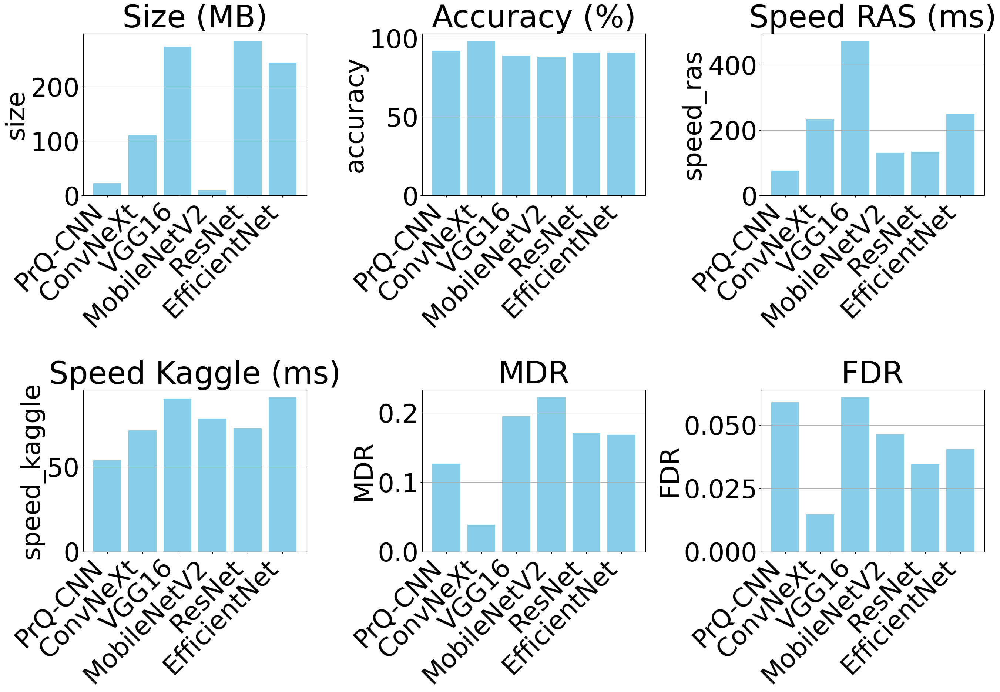

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# dataset of models
models = [
    {
        'name': 'PrQ-CNN',
        'size': 22.28,
        'accuracy': 92.0,
        'speed_ras': 76.3,
        'speed_kaggle': 54.0,
        'MDR': 0.1268,
        'FDR': 0.0591
    },
    {
        'name': 'ConvNeXt',
        'size': 111.35,
        'accuracy': 98.0,
        'speed_ras': 234.3,
        'speed_kaggle': 71.6,
        'MDR': 0.0387,
        'FDR': 0.0147
    },
    {
        'name': 'VGG16',
        'size': 273.56,
        'accuracy': 89.0,
        'speed_ras': 472.2,
        'speed_kaggle': 90.4,
        'MDR': 0.1951,
        'FDR': 0.0609
    },
    {
        'name': 'MobileNetV2',
        'size': 9.6,
        'accuracy': 88.0,
        'speed_ras': 130.4,
        'speed_kaggle': 78.5,
        'MDR': 0.2221,
        'FDR': 0.0463
    },
    {
        'name': 'ResNet',
        'size': 283.44,
        'accuracy': 91.0,
        'speed_ras': 133.4,
        'speed_kaggle': 72.9,
        'MDR': 0.1709,
        'FDR': 0.0346
    },
    {
        'name': 'EfficientNet',
        'size': 244.22,
        'accuracy': 91.0,
        'speed_ras': 250.0,
        'speed_kaggle': 91.0,
        'MDR': 0.1682,
        'FDR': 0.0405
    }
]

# create DataFrame
df = pd.DataFrame(models)

# draw plots
fig, axes = plt.subplots(2, 3, figsize=(28, 20))
axes = axes.flatten()

parameters = ['size', 'accuracy', 'speed_ras', 'speed_kaggle', 'MDR', 'FDR']
titles = ['Size (MB)', 'Accuracy (%)', 'Speed RAS (ms)', 
          'Speed Kaggle (ms)', 'MDR', 'FDR']

for i, param in enumerate(parameters):
    ax = axes[i]
    ax.bar(df['name'], df[param], color='skyblue')
    ax.set_title(titles[i])
    ax.set_ylabel(param)
    ax.set_xticklabels(df['name'], rotation=45, ha='right')
    ax.grid(axis='y')
    
plt.rcParams.update({'font.size': 50})
plt.tight_layout()

# save image plot
plt.savefig('bieu_do_mo_hinh.png')  
# show image plot
plt.show()

In [26]:
import pandas as pd

# dataset of models
models = [
    {
        'name': 'PrQ-CNN',
        'size': 22.28,
        'accuracy': 92.0,
        'speed_ras': 76.3,
        'speed_kaggle': 54.0,
        'MDR': 0.1268,
        'FDR': 0.0591
    },
    {
        'name': 'ConvNeXt',
        'size': 111.35,
        'accuracy': 98.0,
        'speed_ras': 234.3,
        'speed_kaggle': 71.6,
        'MDR': 0.0387,
        'FDR': 0.0147
    },
    {
        'name': 'VGG16',
        'size': 273.56,
        'accuracy': 89.0,
        'speed_ras': 472.2,
        'speed_kaggle': 90.4,
        'MDR': 0.1951,
        'FDR': 0.0609
    },
    {
        'name': 'MobileNetV2',
        'size': 9.6,
        'accuracy': 88.0,
        'speed_ras': 130.4,
        'speed_kaggle': 78.5,
        'MDR': 0.2221,
        'FDR': 0.0463
    },
    {
        'name': 'ResNet',
        'size': 283.44,
        'accuracy': 91.0,
        'speed_ras': 133.4,
        'speed_kaggle': 72.9,
        'MDR': 0.1709,
        'FDR': 0.0346
    },
    {
        'name': 'EfficientNet',
        'size': 244.22,
        'accuracy': 91.0,
        'speed_ras': 250.0,
        'speed_kaggle': 91.0,
        'MDR': 0.1682,
        'FDR': 0.0405
    }
]


# convert to DataFrame
df = pd.DataFrame(models)

# parameters
parameters = ['size', 'accuracy', 'speed_ras', 'speed_kaggle', 'MDR', 'FDR']

# get min and max
def get_model_for_value(column, find_max=True):
    if find_max:
        idx = df[column].idxmax()
    else:
        idx = df[column].idxmin()
    return df.iloc[idx]['name']

# create table 1: min size, max accuracy, min speed1, speed2, MDR, FDR
table1_data = {
    'Parameter': parameters,
    'Value': [
        df['size'].min(),
        df['accuracy'].max(),
        df['speed_ras'].min(),
        df['speed_kaggle'].min(),
        df['MDR'].min(),
        df['FDR'].min()
    ],
    'Model': [
        get_model_for_value('size', find_max=False),
        get_model_for_value('accuracy', find_max=True),
        get_model_for_value('speed_ras', find_max=False),
        get_model_for_value('speed_kaggle', find_max=False),
        get_model_for_value('MDR', find_max=False),
        get_model_for_value('FDR', find_max=False)
    ]
}

# create table 2: max size, min accuracy, max speed1, speed2, MDR, FDR
table2_data = {
    'Parameter': parameters,
    'Value': [
        df['size'].max(),
        df['accuracy'].min(),
        df['speed_ras'].max(),
        df['speed_kaggle'].max(),
        df['MDR'].max(),
        df['FDR'].max()
    ],
    'Model': [
        get_model_for_value('size', find_max=True),
        get_model_for_value('accuracy', find_max=False),
        get_model_for_value('speed_ras', find_max=True),
        get_model_for_value('speed_kaggle', find_max=True),
        get_model_for_value('MDR', find_max=True),
        get_model_for_value('FDR', find_max=True)
    ]
}

# Convert to DataFrame
df_table1 = pd.DataFrame(table1_data)
df_table2 = pd.DataFrame(table2_data)

print("Table 1 (Min size, Max accuracy, Min speed_ras, speed_kaggle, MDR, FDR")
print(df_table1)

print("\nTable 2 (Max size, Min accuracy, Max speed_ras, speed_kaggle, MDR, FDR")
print(df_table2)

Table 1 (Min size, Max accuracy, Min speed_ras, speed_kaggle, MDR, FDR
      Parameter    Value        Model
0          size   9.6000  MobileNetV2
1      accuracy  98.0000     ConvNeXt
2     speed_ras  76.3000      PrQ-CNN
3  speed_kaggle  54.0000      PrQ-CNN
4           MDR   0.0387     ConvNeXt
5           FDR   0.0147     ConvNeXt

Table 2 (Max size, Min accuracy, Max speed_ras, speed_kaggle, MDR, FDR
      Parameter     Value         Model
0          size  283.4400        ResNet
1      accuracy   88.0000   MobileNetV2
2     speed_ras  472.2000         VGG16
3  speed_kaggle   91.0000  EfficientNet
4           MDR    0.2221   MobileNetV2
5           FDR    0.0609         VGG16
